# Disease Prediction Pipeline

This notebook implements an end-to-end disease prediction system using the `Training.csv` dataset for training and other CSVs for recommendations. It includes:
- Data loading and preprocessing
- Training Decision Tree, Random Forest, SVM, XGBoost
- Voting and Stacking ensembles
- Evaluation: learning curves, confusion matrices, ROC-AUC (multiclass)
- SHAP explainability for XGBoost and Kernel SHAP for stacking (sample)
- Recommendation lookup from CSV files for Description, Precautions, Workouts, Medications, Diets
- Saving model artifacts

Make sure the following files are in the same folder as this notebook:
- `Training.csv` (used for training)
- `symtoms_df.csv` (optional)
- `precautions_df.csv`
- `workout_df.csv`
- `description.csv`
- `medications.csv`
- `diets.csv`

Install required packages if missing:
```
pip install pandas numpy scikit-learn xgboost imbalanced-learn shap matplotlib joblib
```

In [1]:
# Environment: local workspace (no Colab mount needed)
# If running in Colab, you can uncomment the following two lines.
# from google.colab import drive
# drive.mount('/content/drive')

In [2]:
# 1. Imports and configuration
import os
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import joblib
%matplotlib inline
from sklearn.model_selection import train_test_split, learning_curve
from sklearn.preprocessing import LabelEncoder, label_binarize, StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, StackingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt

try:
    from xgboost import XGBClassifier
    HAS_XGB = True
except Exception:
    HAS_XGB = False

try:
    import shap
    HAS_SHAP = True
except Exception:
    HAS_SHAP = False

RANDOM_STATE = 42
TEST_SIZE = 0.2
TOP_K = 3
MODEL_DIR = 'models'
os.makedirs(MODEL_DIR, exist_ok=True)
print('Configuration ready. HAS_XGB=', HAS_XGB, 'HAS_SHAP=', HAS_SHAP)


Configuration ready. HAS_XGB= True HAS_SHAP= True


In [3]:
# 2. Load datasets (local paths)
DATA_TRAIN = 'dataset/trainings.csv'
FILE_DESCRIPTION = 'description.csv'
FILE_PRECAUTIONS = 'precautions_df.csv'
FILE_WORKOUT = 'workout_df.csv'
FILE_MEDICATIONS = 'medications.csv'
FILE_DIETS = 'diets.csv'

print('Looking for files in current directory:', os.listdir('.')[:10])

# Robust read with latin1 fallback
def safe_read(path):
    if os.path.exists(path):
        try:
            return pd.read_csv(path)
        except UnicodeDecodeError:
            return pd.read_csv(path, encoding='latin1')
        except Exception as e:
            print(f'Failed reading {path}:', e)
            return pd.DataFrame()
    else:
        print(f'Warning: {path} not found. Using empty dataframe')
        return pd.DataFrame()

assert os.path.exists(DATA_TRAIN), f"{DATA_TRAIN} not found in current directory"
dataset = safe_read(DATA_TRAIN)
print('Loaded Training dataset with shape:', dataset.shape)

description_df = safe_read(FILE_DESCRIPTION)
precautions_df = safe_read(FILE_PRECAUTIONS)
workout_df = safe_read(FILE_WORKOUT)
medications_df = safe_read(FILE_MEDICATIONS)
diets_df = safe_read(FILE_DIETS)

print('Recommendation files shapes:')
print('description:', description_df.shape)
print('precautions:', precautions_df.shape)
print('workout:', workout_df.shape)
print('medications:', medications_df.shape)
print('diets:', diets_df.shape)


Looking for files in current directory: ['workout_df.csv', 'contact.html', '.gitignore', 'img.png', 'new_training_dataset_manual_export.html', 'README.md', 'updatedtestedrf.html', 'label_encoder.pkl', 'data', 'symtoms_df.csv']
Loaded Training dataset with shape: (391, 1327)
Recommendation files shapes:
description: (41, 2)
precautions: (41, 6)
workout: (410, 4)
medications: (41, 2)
diets: (41, 2)


In [4]:
# 3. Basic data cleaning & inspection
display(dataset.head())
print('Columns (first 20):', dataset.columns.tolist()[:20])
print('\nChecking for unnamed columns to drop')
unnamed = [c for c in dataset.columns if c.startswith('Unnamed')]
if unnamed:
    print('Dropping columns:', unnamed)
    dataset = dataset.drop(columns=unnamed)

print('\nFinal shape:', dataset.shape)


,Belly button that sticks out,Bulge in the groin or scrotum,Delayed sexual maturity,Delayed teeth,Downward palpebral slant to eyes,"Hairline with a ""widow's peak""",Mildly sunken chest (pectus excavatum),Mild to moderate cognitive problems,Mild to moderate short height,Poorly developed middle section of the face,...,Tiny white spots inside the mouth (Koplik spots),Abnormal strength and direction of urine stream,Bed wetting,Bleeding (hematuria) at end of urination,Visible narrowing of the urethral opening in boys,Swelling and redness of eyelid edges,Slight blurring of vision due to excess oil in tears,Frequent styes(bumps),Pressure in the ear,Prognosis
0,1,1,1,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,Aarskog syndrome
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Aase syndrome
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Abdominal aortic aneurysm
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Abnormal uterine bleeding (AUB)
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Acetaminophen and codeine overdose


Columns (first 20): ['Belly button that sticks out', 'Bulge in the groin or scrotum', 'Delayed sexual maturity', 'Delayed teeth', 'Downward palpebral slant to eyes\xa0', 'Hairline with a "widow\'s peak"', 'Mildly sunken chest (pectus excavatum)', 'Mild to moderate cognitive problems', 'Mild to moderate short height', 'Poorly developed middle section of the face', 'Short fingers and toes with mild webbing', 'Single crease in the palm of the hand', 'Small nose with nostrils tipped forward', 'Testicles that have not come down (undescended)', 'Top portion of the ear folded over slightly', 'Wide-set eyes with droopy eyelids', 'Absent or small knuckles', 'Cleft palate', 'Deformed ears', 'Inability to fully extend the joints from birth']

Checking for unnamed columns to drop

Final shape: (391, 1327)


In [5]:
# 4. Prepare features and target
# Assume last column is the target 'prognosis' in common Kaggle dataset. If different, change here.
target_col = dataset.columns[-1]
print('Using target column:', target_col)
X = dataset.iloc[:, :-1]
y = dataset.iloc[:, -1]
print('X shape:', X.shape, 'y shape:', y.shape)

# Basic preprocessing: convert object columns to numeric if possible, fill NaN with 0
X_proc = X.copy()
for col in X_proc.columns:
    if X_proc[col].dtype == 'object':
        X_proc[col] = X_proc[col].str.strip().str.lower().replace({'yes':1, 'no':0, 'y':1, 'n':0})
    # attempt numeric conversion
    X_proc[col] = pd.to_numeric(X_proc[col], errors='ignore')
X_proc = X_proc.fillna(0).astype(float)

le = LabelEncoder()
y_enc = le.fit_transform(y)
print('Number of classes:', len(le.classes_))
print('Classes:', le.classes_)


Using target column: Prognosis
X shape: (391, 1326) y shape: (391,)
Number of classes: 391
Classes: ['Aarskog syndrome' 'Aase syndrome' 'Abdominal aortic\xa0aneurysm'
 'Abnormal uterine bleeding (AUB)' 'Acetaminophen and codeine overdose'
 'Acetone poisoning' 'Achalasia' 'Achondrogenesis' 'Achondroplasia'
 'Acid soldering flux poisoning' 'Acidosis' 'Acne' 'Acoustic neuroma'
 'Acrodysostosis' 'Acromegaly' 'Acute adrenal crisis'
 'Acute arterial occlusion - kidney' 'Acute bronchitis'
 'Acute cerebellar ataxia' 'Acute cholecystitis' 'Acute coronary syndrome'
 'Acute flaccid myelitis' 'Acute kidney failure'
 'Acute lymphoblastic leukemia' 'Acute mountain sickness'
 'Acute myeloid leukemia' 'Acute nephritic syndrome' 'Acute pancreatitis'
 'Acute respiratory distress syndrome' 'Acute tubular necrosis'
 'Addison disease' 'Adenomyosis' 'Adhesion' 'Adjustment disorder'
 'Adrenoleukodystrophy' 'Agammaglobulinemia' 'Agoraphobia'
 'Agranulocytosis' 'Albinism' 'Alkalosis' 'Allergic conjunctivitis'


In [6]:
# 5. Train-test split (robust to singleton classes)
import numpy as np
class_counts = np.bincount(y_enc)
use_stratify = np.min(class_counts) >= 2
stratify_var = y_enc if use_stratify else None
if not use_stratify:
    print('Note: disabling stratify because at least one class has only 1 sample')
X_train, X_test, y_train, y_test = train_test_split(
    X_proc, y_enc, test_size=TEST_SIZE, stratify=stratify_var, random_state=RANDOM_STATE
)
print('Train shape:', X_train.shape, 'Test shape:', X_test.shape)


Note: disabling stratify because at least one class has only 1 sample
Train shape: (312, 1326) Test shape: (79, 1326)


In [7]:
# 6. Model definitions
dt = DecisionTreeClassifier(random_state=RANDOM_STATE)
rf = RandomForestClassifier(n_estimators=200, random_state=RANDOM_STATE, n_jobs=-1)
svm = SVC(kernel='rbf', probability=True, random_state=RANDOM_STATE)
if HAS_XGB:
    xgb = XGBClassifier(n_estimators=200, use_label_encoder=False, eval_metric='mlogloss', random_state=RANDOM_STATE)
else:
    xgb = None

print('Models defined. XGBoost available:', xgb is not None)


Models defined. XGBoost available: True


In [8]:
# 7. Training base models
print('Training Decision Tree...')
dt.fit(X_train, y_train)
print('Training Random Forest...')
rf.fit(X_train, y_train)
print('Training SVM...')
svm.fit(X_train, y_train)
if xgb is not None:
    try:
        print('Training XGBoost...')
        # Ensure objective/multi-class handling
        xgb.set_params(objective='multi:softprob', num_class=len(le.classes_))
        xgb.fit(X_train, y_train)
    except Exception as e:
        print('Skipping XGBoost due to error:', e)
print('Base models trained')


Training Decision Tree...
Training Random Forest...
Training SVM...
Training XGBoost...
Skipping XGBoost due to error: Invalid classes inferred from unique values of `y`.  Expected: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 20

In [9]:
# 8. Evaluate base models
models = {'Decision Tree': dt, 'Random Forest': rf, 'SVM': svm}
if xgb is not None:
    models['XGBoost'] = xgb

labels_eval = np.unique(y_test)
label_names_eval = le.inverse_transform(labels_eval)
mask_seen = np.isin(y_test, np.unique(y_train))

for name, m in models.items():
    print('\n---', name, '---')
    try:
        ypred = m.predict(X_test)
        acc_overall = accuracy_score(y_test, ypred)
        print('Accuracy (overall test):', acc_overall)
        if mask_seen.any():
            acc_seen = accuracy_score(y_test[mask_seen], ypred[mask_seen])
            print('Accuracy (seen classes only):', acc_seen)
        try:
            print(classification_report(y_test, ypred, labels=labels_eval, target_names=label_names_eval))
        except Exception as e:
            print('classification_report failed:', e)
    except Exception as e:
        print('Skipping evaluation for', name, 'due to error:', e)



--- Decision Tree ---
Accuracy (overall test): 0.0
                                                   precision    recall  f1-score   support

                                 Aarskog syndrome       0.00      0.00      0.00       1.0
                  Abnormal uterine bleeding (AUB)       0.00      0.00      0.00       1.0
                                Acetone poisoning       0.00      0.00      0.00       1.0
                    Acid soldering flux poisoning       0.00      0.00      0.00       1.0
                             Acute adrenal crisis       0.00      0.00      0.00       1.0
                          Acute cerebellar ataxia       0.00      0.00      0.00       1.0
                             Acute kidney failure       0.00      0.00      0.00       1.0
                           Acute myeloid leukemia       0.00      0.00      0.00       1.0
                                  Addison disease       0.00      0.00      0.00       1.0
                                     

In [10]:
# 9. Voting ensemble (soft)
estimators = [('dt', dt), ('rf', rf), ('svm', svm)]
if xgb is not None:
    estimators.append(('xgb', xgb))

voting = VotingClassifier(estimators=estimators, voting='soft', n_jobs=-1)
voting.fit(X_train, y_train)
y_vote = voting.predict(X_test)
acc_overall = accuracy_score(y_test, y_vote)
print('\nVoting Accuracy (overall test):', acc_overall)
mask_seen = np.isin(y_test, np.unique(y_train))
if mask_seen.any():
    acc_seen = accuracy_score(y_test[mask_seen], y_vote[mask_seen])
    print('Voting Accuracy (seen classes only):', acc_seen)
try:
    print(classification_report(y_test, y_vote, labels=labels_eval, target_names=label_names_eval))
except Exception as e:
    print('classification_report failed:', e)



Voting Accuracy (overall test): 0.0
                                                   precision    recall  f1-score   support

                                 Aarskog syndrome       0.00      0.00      0.00       1.0
                  Abnormal uterine bleeding (AUB)       0.00      0.00      0.00       1.0
                                Acetone poisoning       0.00      0.00      0.00       1.0
                    Acid soldering flux poisoning       0.00      0.00      0.00       1.0
                             Acute adrenal crisis       0.00      0.00      0.00       1.0
                          Acute cerebellar ataxia       0.00      0.00      0.00       1.0
                             Acute kidney failure       0.00      0.00      0.00       1.0
                           Acute myeloid leukemia       0.00      0.00      0.00       1.0
                                  Addison disease       0.00      0.00      0.00       1.0
                                      Adenomyosis   

In [11]:
# 10. Stacking ensemble
from sklearn.model_selection import KFold, StratifiedKFold

# Use only RF and DT in stacking to avoid label contiguity issues with XGB in CV
base_estimators = [('rf', rf), ('dt', dt)]

# Choose CV strategy safe for singleton classes
class_counts_train = np.bincount(y_train)
min_count_train = int(class_counts_train[class_counts_train > 0].min()) if len(class_counts_train) else 1
if min_count_train < 2:
    cv_obj = KFold(n_splits=2, shuffle=True, random_state=RANDOM_STATE)
else:
    cv_obj = StratifiedKFold(n_splits=min(5, min_count_train), shuffle=True, random_state=RANDOM_STATE)

stack = StackingClassifier(estimators=base_estimators, final_estimator=LogisticRegression(max_iter=1000), n_jobs=-1, cv=cv_obj)
stack.fit(X_train, y_train)
y_stack = stack.predict(X_test)
print('\nStacking Accuracy (overall test):', accuracy_score(y_test, y_stack))
mask_seen = np.isin(y_test, np.unique(y_train))
if mask_seen.any():
    print('Stacking Accuracy (seen classes only):', accuracy_score(y_test[mask_seen], y_stack[mask_seen]))
try:
    print(classification_report(y_test, y_stack, labels=labels_eval, target_names=label_names_eval))
except Exception as e:
    print('classification_report failed:', e)



Stacking Accuracy (overall test): 0.0
                                                   precision    recall  f1-score   support

                                 Aarskog syndrome       0.00      0.00      0.00       1.0
                  Abnormal uterine bleeding (AUB)       0.00      0.00      0.00       1.0
                                Acetone poisoning       0.00      0.00      0.00       1.0
                    Acid soldering flux poisoning       0.00      0.00      0.00       1.0
                             Acute adrenal crisis       0.00      0.00      0.00       1.0
                          Acute cerebellar ataxia       0.00      0.00      0.00       1.0
                             Acute kidney failure       0.00      0.00      0.00       1.0
                           Acute myeloid leukemia       0.00      0.00      0.00       1.0
                                  Addison disease       0.00      0.00      0.00       1.0
                                      Adenomyosis 

In [12]:
# 11. Plotting utilities: Learning curve, Confusion matrix, Multiclass ROC-AUC
%matplotlib inline
import numpy as np
from sklearn.model_selection import StratifiedKFold

def _safe_cv(y):
    # Use a safe CV value: at least 2 folds, but not exceeding min class count
    class_counts = np.bincount(y)
    min_count = int(class_counts[class_counts > 0].min()) if len(class_counts) else 1
    return max(2, min(5, min_count))

def plot_learning_curve_model(model, X, y, title=None):
    if title is None:
        title = f'Learning Curve ({type(model).__name__})'
    cv_val = _safe_cv(y)
    try:
        train_sizes, train_scores, test_scores = learning_curve(
            model, X, y, cv=cv_val, scoring='accuracy',
            train_sizes=np.linspace(0.1, 1.0, 5), n_jobs=-1
        )
        train_mean = np.mean(train_scores, axis=1)
        test_mean = np.mean(test_scores, axis=1)
        plt.figure(figsize=(8,5))
        plt.plot(train_sizes, train_mean, label='Training score')
        plt.plot(train_sizes, test_mean, label='Validation score')
        plt.xlabel('Training examples')
        plt.ylabel('Accuracy')
        plt.title(title)
        plt.legend()
        plt.grid(True)
        plt.show()
    except Exception as e:
        print('Learning curve failed:', e)


def plot_confusion_matrix_model(model, X_test, y_test, title=None):
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=le.classes_)
    plt.figure(figsize=(8,6))
    disp.plot(values_format='d', ax=plt.gca())
    if title:
        plt.title(title)
    plt.show()


def plot_multiclass_roc_model(model, X_test, y_test, title=None):
    # Binarize labels with full training classes to keep indices stable
    classes = np.unique(y_test)
    n_classes = len(classes)
    y_test_b = label_binarize(y_test, classes=classes)
    # Get scores
    if hasattr(model, 'predict_proba'):
        y_score = model.predict_proba(X_test)
    elif hasattr(model, 'decision_function'):
        y_score = model.decision_function(X_test)
    else:
        print('Model lacks probability/decision_function for ROC. Skipping.')
        return
    # Ensure 2D shape
    if y_score.ndim == 1:
        y_score = np.vstack([1 - y_score, y_score]).T
    try:
        plt.figure(figsize=(8,6))
        for i in range(n_classes):
            fpr, tpr, _ = roc_curve(y_test_b[:, i], y_score[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, lw=2, label=f'{classes[i]} (AUC = {roc_auc:.2f})')
        plt.plot([0,1],[0,1],'k--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        if title:
            plt.title(title)
        else:
            plt.title(f'Multiclass ROC (One-vs-Rest) - {type(model).__name__}')
        plt.legend(loc='lower right', fontsize='small')
        plt.grid(True)
        plt.show()
    except Exception as e:
        print('ROC plotting failed:', e)

print('Plot utilities ready')


Plot utilities ready



==== Decision Tree ====
Learning curve failed: n_splits=2 cannot be greater than the number of members in each class.
Could not plot confusion matrix for Decision Tree -> The number of FixedLocator locations (115), usually from a call to set_ticks, does not match the number of labels (391).


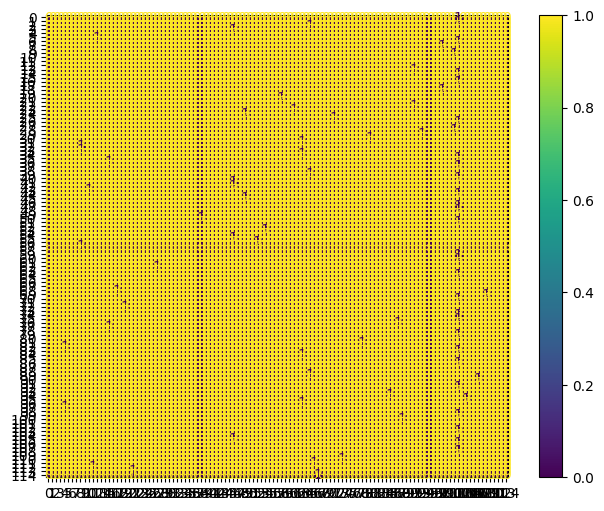

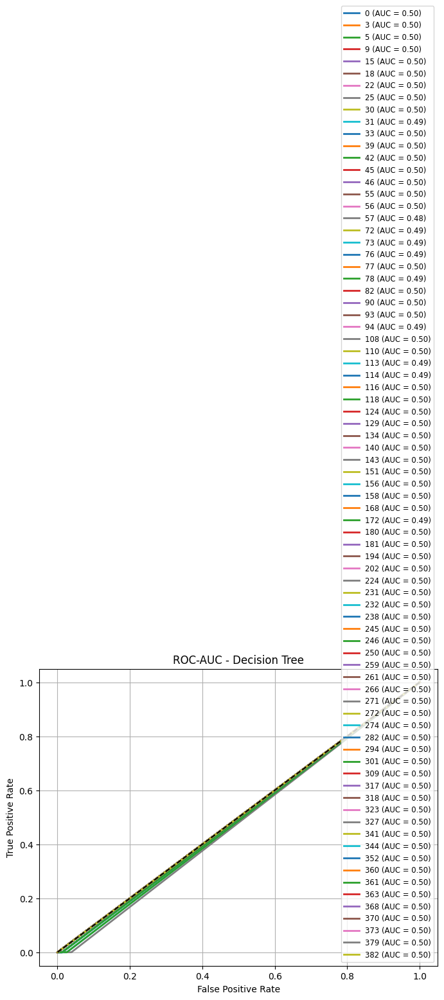


==== Random Forest ====
Learning curve failed: n_splits=2 cannot be greater than the number of members in each class.
Could not plot confusion matrix for Random Forest -> The number of FixedLocator locations (135), usually from a call to set_ticks, does not match the number of labels (391).


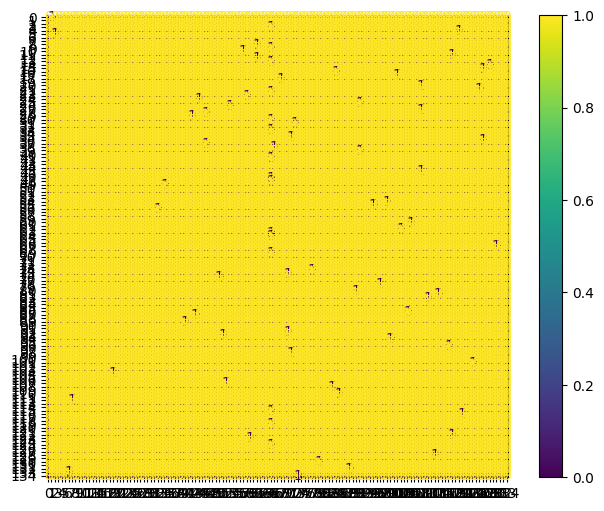

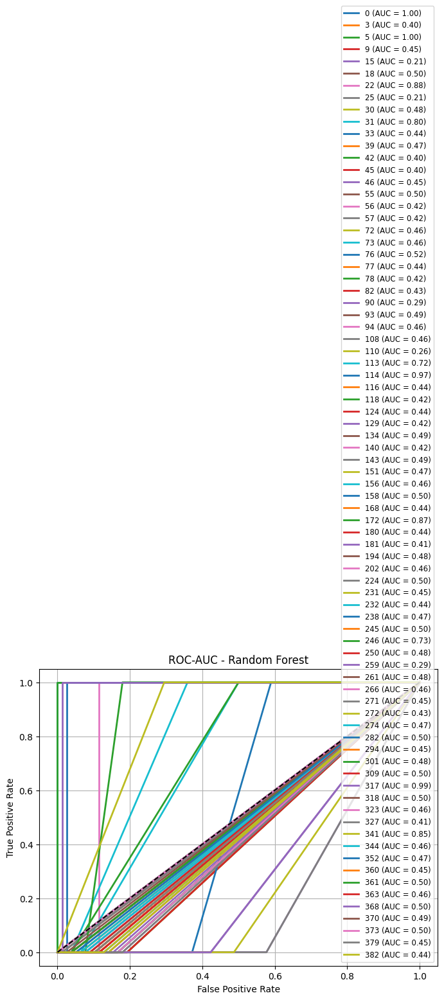


==== SVM ====
Learning curve failed: n_splits=2 cannot be greater than the number of members in each class.
Could not plot confusion matrix for SVM -> The number of FixedLocator locations (116), usually from a call to set_ticks, does not match the number of labels (391).


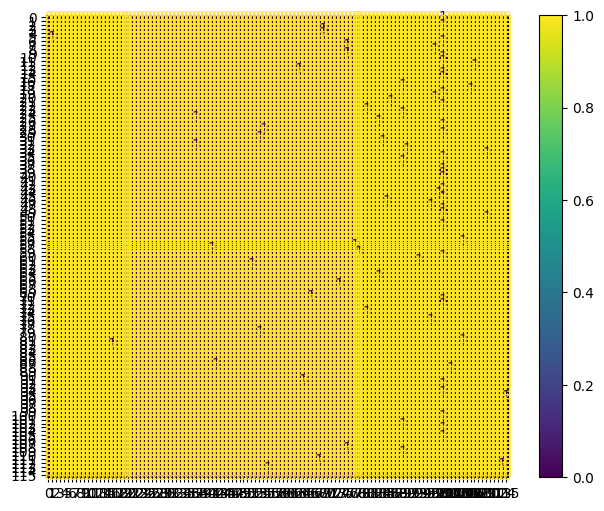

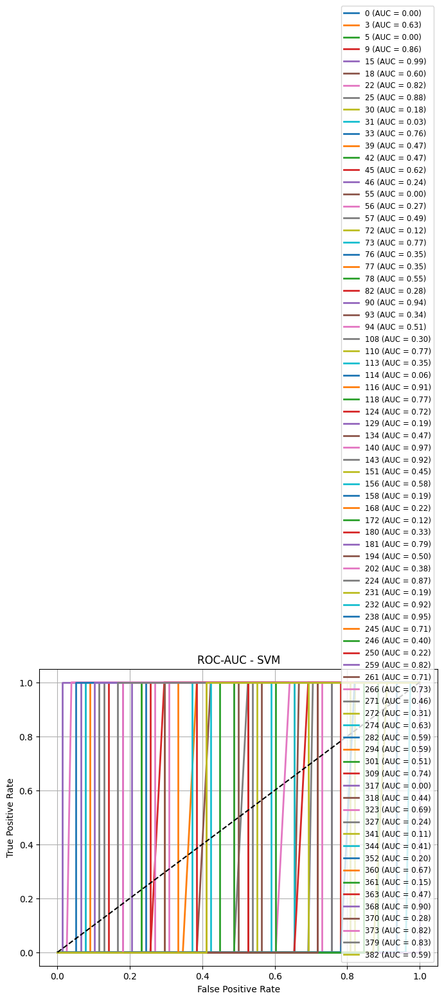


==== XGBoost ====
Learning curve failed: n_splits=2 cannot be greater than the number of members in each class.
Could not plot confusion matrix for XGBoost -> need to call fit or load_model beforehand
Could not plot ROC for XGBoost -> need to call fit or load_model beforehand

==== Voting ====
Learning curve failed: n_splits=2 cannot be greater than the number of members in each class.
Could not plot confusion matrix for Voting -> The number of FixedLocator locations (115), usually from a call to set_ticks, does not match the number of labels (391).


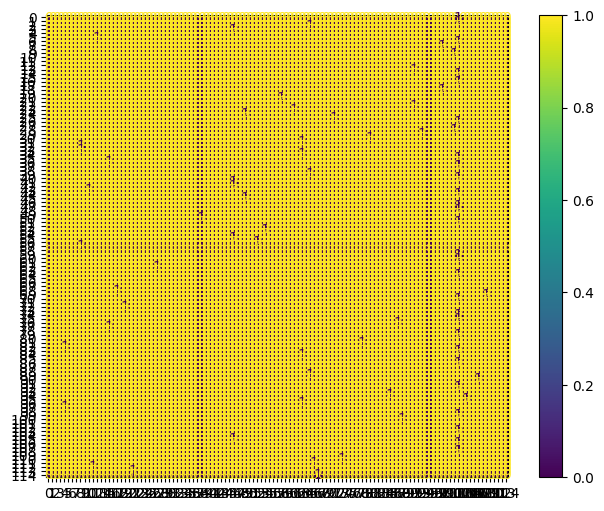

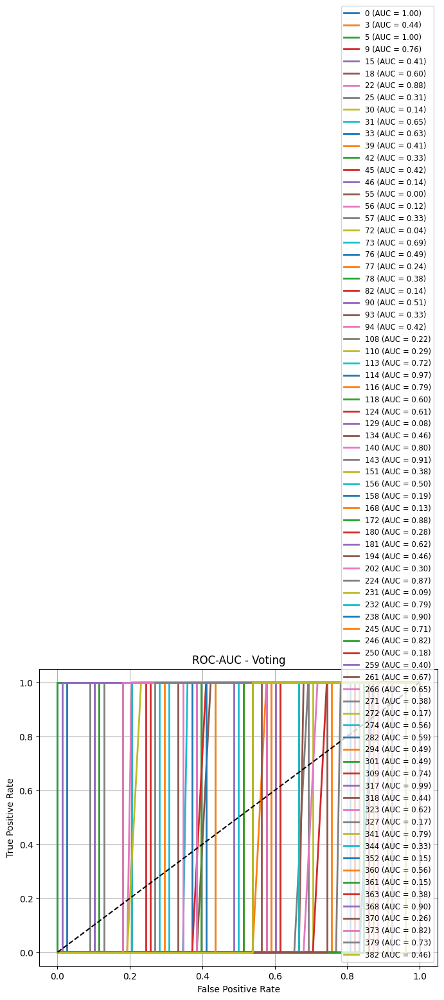


==== Stacking ====
Learning curve failed: n_splits=2 cannot be greater than the number of members in each class.
Could not plot confusion matrix for Stacking -> The number of FixedLocator locations (118), usually from a call to set_ticks, does not match the number of labels (391).


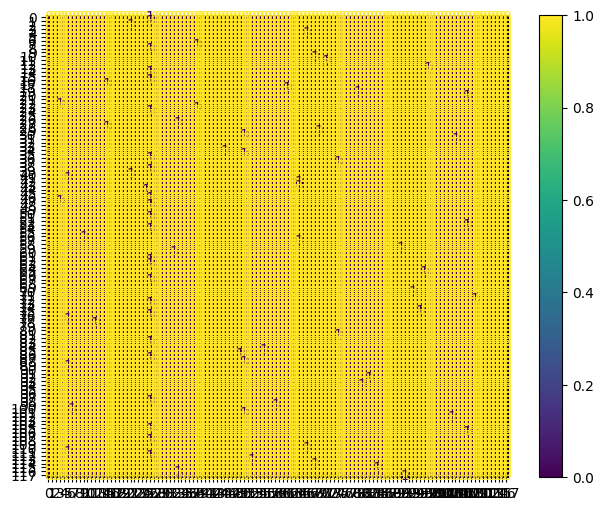

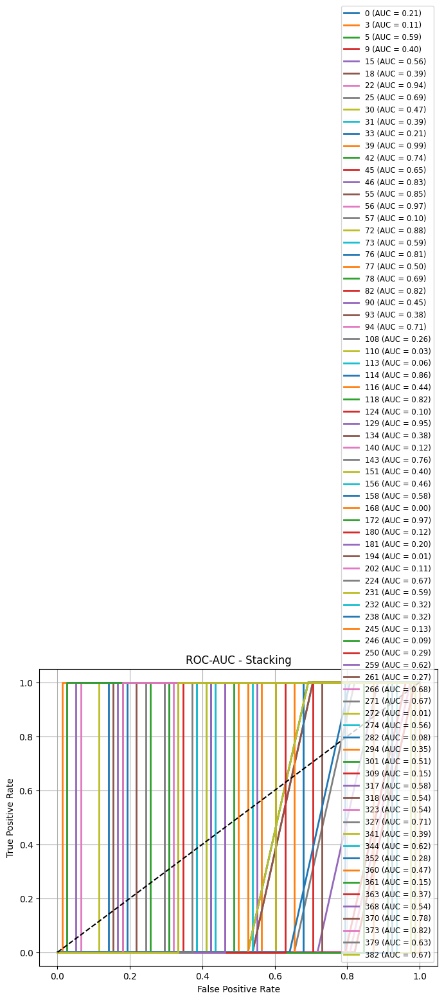

In [13]:
# 12. Generate plots for each model and ensembles
all_models = {**models, 'Voting': voting, 'Stacking': stack}
for name, m in all_models.items():
    print('\n====', name, '====')
    try:
        plot_learning_curve_model(m, X_train, y_train, title=f'Learning Curve - {name}')
    except Exception as e:
        print('Could not plot learning curve for', name, '->', e)
    try:
        plot_confusion_matrix_model(m, X_test, y_test, title=f'Confusion Matrix - {name}')
    except Exception as e:
        print('Could not plot confusion matrix for', name, '->', e)
    try:
        plot_multiclass_roc_model(m, X_test, y_test, title=f'ROC-AUC - {name}')
    except Exception as e:
        print('Could not plot ROC for', name, '->', e)


Computing SHAP TreeExplainer for XGBoost (global summary)...
Skipping XGB SHAP due to error: need to call fit or load_model beforehand

Computing Kernel SHAP for stacking (sample-based, may be slow)


  0%|          | 0/20 [00:00<?, ?it/s]

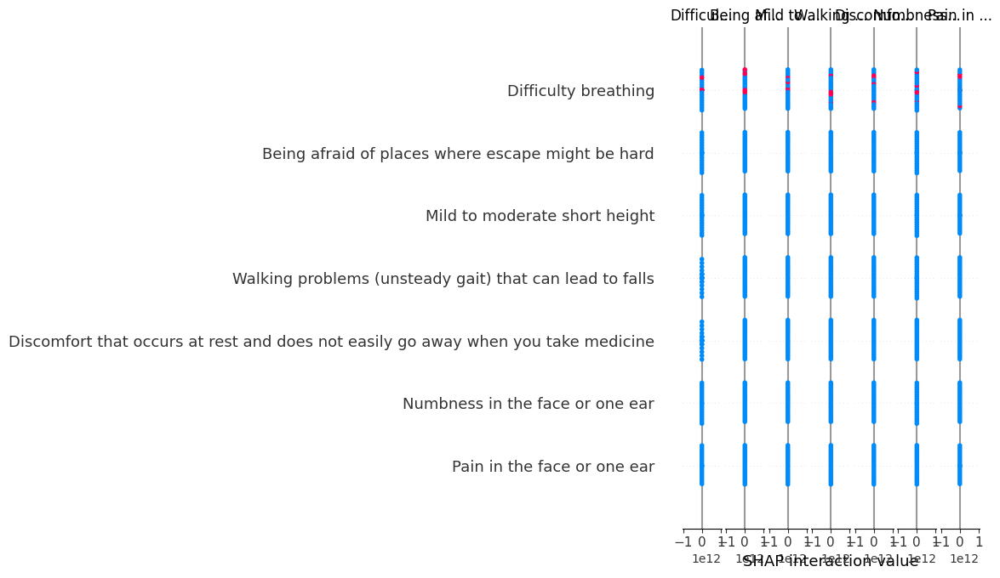

In [14]:
# 13. SHAP explainability
if HAS_SHAP and xgb is not None:
    try:
        print('Computing SHAP TreeExplainer for XGBoost (global summary)...')
        explainer_xgb = shap.TreeExplainer(xgb)
        # compute shap values on a sample to keep runtime reasonable
        sample = X_test.sample(n=min(200, X_test.shape[0]), random_state=RANDOM_STATE)
        shap_values_xgb = explainer_xgb.shap_values(sample)
        try:
            shap.summary_plot(shap_values_xgb, sample, plot_type='bar')
            shap.summary_plot(shap_values_xgb, sample)
        except Exception as e:
            print('Could not render SHAP plots in this environment:', e)
    except Exception as e:
        print('Skipping XGB SHAP due to error:', e)
else:
    print('SHAP or XGBoost not available; skipping TreeExplainer')

if HAS_SHAP:
    print('\nComputing Kernel SHAP for stacking (sample-based, may be slow)')
    # Kernel SHAP is model-agnostic but slow — use small sample
    try:
        background = shap.sample(X_train, 50, random_state=RANDOM_STATE)
        explainer_stack = shap.KernelExplainer(stack.predict_proba, background)
        sample2 = shap.sample(X_test, min(20, X_test.shape[0]), random_state=RANDOM_STATE)
        shap_values_stack = explainer_stack.shap_values(sample2, nsamples=100)
        shap.summary_plot(shap_values_stack, sample2)
    except Exception as e:
        print('Kernel SHAP failed or too slow in this environment:', e)
else:
    print('SHAP not available; skipping KernelExplainer')


In [15]:
# 14. Recommendation lookup helpers
def get_description(disease_name):
    if description_df.empty:
        return 'Description not available (file missing)'
    # try common column names
    cols = [c.lower() for c in description_df.columns]
    # assume columns like 'Disease' and 'Description'
    if 'disease' in cols and 'description' in cols:
        row = description_df[description_df.iloc[:, cols.index('disease')] == disease_name]
        if not row.empty:
            return row.iloc[0, cols.index('description')]
    # fallback: try to find row where disease appears in any column
    for _, r in description_df.iterrows():
        if disease_name in r.astype(str).values:
            # return first non-empty string
            for val in r.astype(str).values:
                if val and val.lower() != 'nan' and disease_name.lower() not in val.lower():
                    return val
    return 'Description not available for this disease'

def get_list_from_df(df, disease_name):
    if df.empty:
        return []
    cols = [c.lower() for c in df.columns]
    if 'disease' in cols:
        idx = cols.index('disease')
        row = df[df.iloc[:, idx] == disease_name]
        if not row.empty:
            # return all other columns values as list
            vals = row.iloc[0].drop(row.columns[idx]).dropna().astype(str).tolist()
            return vals
    # fallback: search rows
    for _, r in df.iterrows():
        if disease_name in r.astype(str).values:
            vals = [v for v in r.astype(str).values if v and v.lower() != 'nan' and disease_name.lower() not in v.lower()]
            return vals
    return []

def get_recommendations_for_disease(disease_name):
    desc = get_description(disease_name)
    precautions = get_list_from_df(precautions_df, disease_name)
    workouts = get_list_from_df(workout_df, disease_name)
    meds = get_list_from_df(medications_df, disease_name)
    diets = get_list_from_df(diets_df, disease_name)
    return {
        'disease': disease_name,
        'description': desc,
        'precautions': precautions,
        'workouts': workouts,
        'medications': meds,
        'diets': diets
    }

print('Recommendation helpers ready')


Recommendation helpers ready


In [16]:
# 15. Prediction + top-K + explain function
def predict_topk_and_recommend(symptom_dict_or_list, top_k=TOP_K):
    """
    Accepts either a list of symptom names or a dict {symptom: 0/1}.
    Returns top-k predictions from voting ensemble (with probabilities), stacking single prediction, and recommendations.
    """
    # build input vector
    if isinstance(symptom_dict_or_list, dict):
        row = [float(symptom_dict_or_list.get(col, 0)) for col in X_proc.columns]
    elif isinstance(symptom_dict_or_list, list):
        row = [1.0 if col in symptom_dict_or_list else 0.0 for col in X_proc.columns]
    else:
        raise ValueError('Input must be list or dict')
    X_row = pd.DataFrame([row], columns=X_proc.columns)
    # voting probabilities
    if hasattr(voting, 'predict_proba'):
        probs = voting.predict_proba(X_row)[0]
    else:
        # fallback: use stacking probs
        probs = stack.predict_proba(X_row)[0]
    top_idx = np.argsort(probs)[::-1][:top_k]
    topk = [(le.classes_[i], float(probs[i])) for i in top_idx]
    # stacking single prediction
    stack_pred = le.inverse_transform(stack.predict(X_row))[0]
    recommendations = [get_recommendations_for_disease(name) for name, _ in topk]
    return {
        'topk': topk,
        'stacking_prediction': stack_pred,
        'recommendations': recommendations
    }

print('Prediction + recommendation function ready')


Prediction + recommendation function ready


In [17]:
# 16. Test the prediction & recommendation function
sample_symptoms = list(X_proc.columns[:5])  # using first 5 columns as example symptoms
print('Sample symptoms used (first 5 columns):', sample_symptoms)
res = predict_topk_and_recommend(sample_symptoms, top_k=3)
import pprint
pprint.pprint(res)


Sample symptoms used (first 5 columns): ['Belly button that sticks out', 'Bulge in the groin or scrotum', 'Delayed sexual maturity', 'Delayed teeth', 'Downward palpebral slant to eyes\xa0']
{'recommendations': [{'description': 'Description not available for this '
                                     'disease',
                      'diets': [],
                      'disease': 'Gastroparesis',
                      'medications': [],
                      'precautions': [],
                      'workouts': []},
                     {'description': 'Description not available for this '
                                     'disease',
                      'diets': [],
                      'disease': 'Cerebral hypoxia',
                      'medications': [],
                      'precautions': [],
                      'workouts': []},
                     {'description': 'Description not available for this '
                                     'disease',
                      'die

In [18]:
# 17. Save model artifacts
artifacts = {
    'dt': dt,
    'rf': rf,
    'svm': svm,
    'xgb': xgb,
    'voting': voting,
    'stack': stack,
    'label_encoder': le,
    'feature_columns': X_proc.columns.tolist()
}
joblib.dump(artifacts, os.path.join(MODEL_DIR, 'model_artifacts.joblib'))
print('Saved artifacts to', os.path.join(MODEL_DIR, 'model_artifacts.joblib'))


Saved artifacts to models/model_artifacts.joblib


## Notes and Next Steps
- The notebook uses `Training.csv` for training and other CSVs for recommendations.
- If SHAP is not installed or available, skip the SHAP cells (they are guarded by `HAS_SHAP`).
- Kernel SHAP is slow — only use small samples for explanation; TreeExplainer is fast for tree models.
- For production, add input validation and secure the recommendation files.
- You can export this notebook as a `.py` script or run it directly in Jupyter/Colab.


In [19]:
# ================================
# 1. IMPORTS
# ================================
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances
from sklearn.tree import DecisionTreeClassifier

plt.style.use("seaborn-v0_8")

# ================================
# 2. LOAD DATASET (robust reader)
# ================================
DATA_PATH = 'dataset/trainings.csv'

def safe_read_csv(path):
    """
    Robust CSV reader that tries multiple encodings and finally binary decode.
    Returns a pandas DataFrame or raises the last error if all attempts fail.
    """
    if not os.path.exists(path):
        raise FileNotFoundError(f"File not found: {path}")
    # Try common encodings
    for enc in (None, 'utf-8', 'latin1', 'cp1252'):
        try:
            return pd.read_csv(path, encoding=enc) if enc else pd.read_csv(path)
        except UnicodeDecodeError:
            continue
        except Exception:
            continue
    # Final fallback: binary read then decode ignore
    try:
        with open(path, 'rb') as f:
            raw = f.read()
        text = raw.decode('utf-8', errors='ignore')
        from io import StringIO
        return pd.read_csv(StringIO(text))
    except Exception as e:
        print(f"Failed robust read for {path}: {e}")
        raise

df = safe_read_csv(DATA_PATH)
print("Dataset shape:", df.shape)
df.head()


Dataset shape: (391, 1327)


,Belly button that sticks out,Bulge in the groin or scrotum,Delayed sexual maturity,Delayed teeth,Downward palpebral slant to eyes,"Hairline with a ""widow's peak""",Mildly sunken chest (pectus excavatum),Mild to moderate cognitive problems,Mild to moderate short height,Poorly developed middle section of the face,...,Tiny white spots inside the mouth (Koplik spots),Abnormal strength and direction of urine stream,Bed wetting,Bleeding (hematuria) at end of urination,Visible narrowing of the urethral opening in boys,Swelling and redness of eyelid edges,Slight blurring of vision due to excess oil in tears,Frequent styes(bumps),Pressure in the ear,Prognosis
0,1,1,1,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,Aarskog syndrome
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Aase syndrome
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Abdominal aortic aneurysm
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Abnormal uterine bleeding (AUB)
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Acetaminophen and codeine overdose


In [20]:
# Determine target column dynamically (assume last column is the label)
print("\nColumns:", df.columns.tolist())
target_col = df.columns[-1]
print("Target column inferred:", target_col)
print("\nNumber of symptoms:", len(df.columns) - 1)

print("\nDiseases:")
print(df[target_col].value_counts())



Columns: ['Belly button that sticks out', 'Bulge in the groin or scrotum', 'Delayed sexual maturity', 'Delayed teeth', 'Downward palpebral slant to eyes\xa0', 'Hairline with a "widow\'s peak"', 'Mildly sunken chest (pectus excavatum)', 'Mild to moderate cognitive problems', 'Mild to moderate short height', 'Poorly developed middle section of the face', 'Short fingers and toes with mild webbing', 'Single crease in the palm of the hand', 'Small nose with nostrils tipped forward', 'Testicles that have not come down (undescended)', 'Top portion of the ear folded over slightly', 'Wide-set eyes with droopy eyelids', 'Absent or small knuckles', 'Cleft palate', 'Deformed ears', 'Inability to fully extend the joints from birth', 'Narrow shoulders', 'Pale skin', 'Triple-jointed thumbs', 'Pain in the abdomen', 'Fainting/Drowsiness', 'Clammy skin', 'Nausea and vomiting', 'Rapid heart rate', 'Shock', 'Bleeding or spotting from the vagina between periods', 'Periods that occur less than 28 days apar

In [21]:
dup_count = df.duplicated().sum()
print("Duplicate rows:", dup_count)
unique_patterns = df.drop_duplicates()
print("Unique patterns:", unique_patterns.shape[0])


Duplicate rows: 0
Unique patterns: 391


In [22]:
symptoms = df.columns[:-1]

df_group = df.groupby(target_col)[symptoms]
unique_patterns = df_group.nunique()
print("\nUnique symptom values per disease:")
print(unique_patterns)

print("\nIf all values = 1 per disease → dataset is deterministic")



Unique symptom values per disease:
                                          Belly button that sticks out  \
Prognosis                                                                
Aarskog syndrome                                                     1   
Aase syndrome                                                        1   
Abdominal aortic aneurysm                                            1   
Abnormal uterine bleeding (AUB)                                      1   
Acetaminophen and codeine overdose                                   1   
...                                                                ...   
Mediastinitis                                                        1   
Meibomianitis                                                        1   
Membranoproliferative glomerulonephritis                             1   
Membranous nephropathy                                               1   
Meniere disease                                                      1   

 

Unique symptom patterns: 391
Total rows: 391


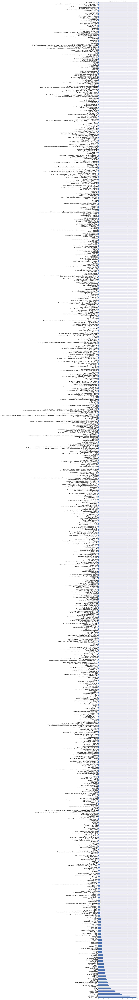

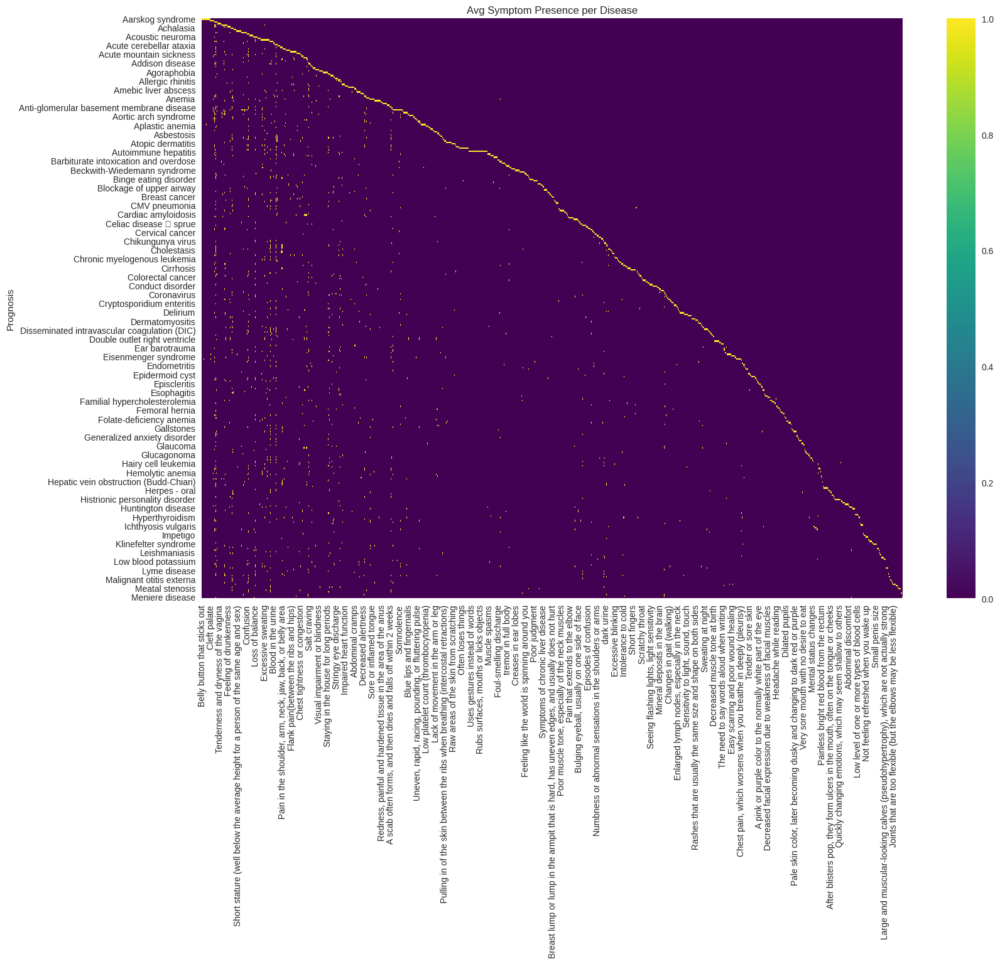

In [23]:
num_unique_patterns = df[symptoms].drop_duplicates().shape[0]
print("Unique symptom patterns:", num_unique_patterns)
print("Total rows:", df.shape[0])
symptom_freq = df[symptoms].sum().sort_values(ascending=False)

plt.figure(figsize=(8,200))
symptom_freq.plot(kind="barh")
plt.title("Symptom Frequency Across Dataset")
plt.show()
plt.figure(figsize=(18,12))
sns.heatmap(df.groupby(target_col)[symptoms].mean(), cmap="viridis")
plt.title("Avg Symptom Presence per Disease")
plt.show()


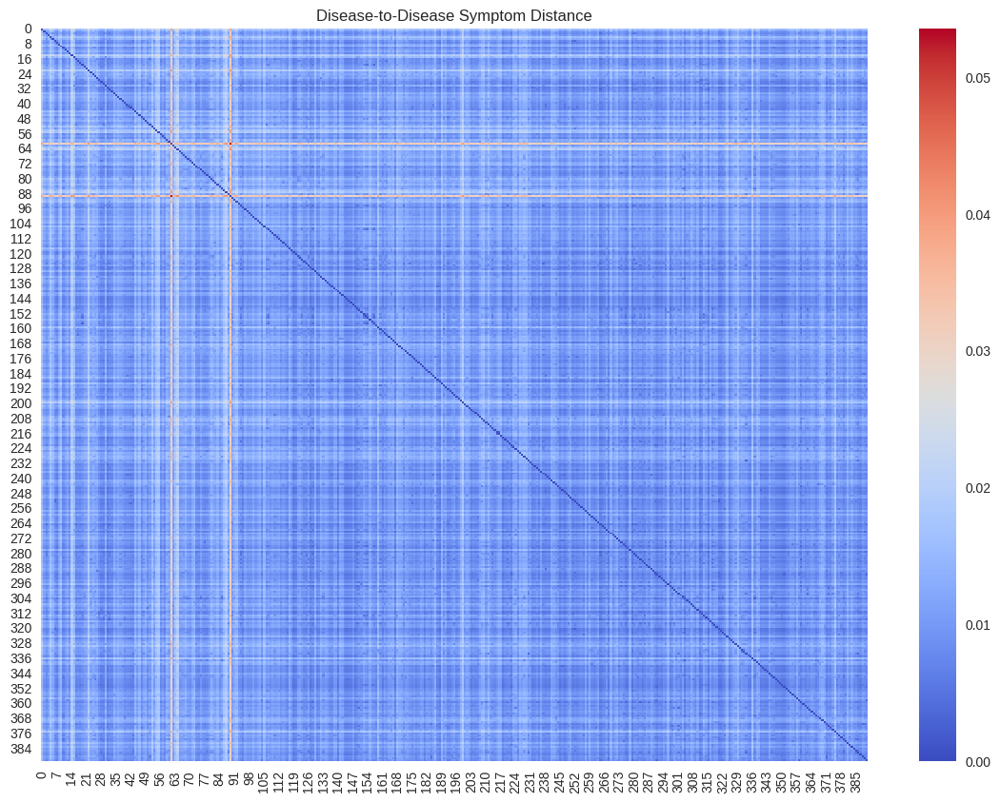

In [24]:
disease_matrix = df.groupby(target_col)[symptoms].mean()

dist = pairwise_distances(disease_matrix, metric="hamming")

plt.figure(figsize=(14,10))
sns.heatmap(dist, cmap="coolwarm")
plt.title("Disease-to-Disease Symptom Distance")
plt.show()


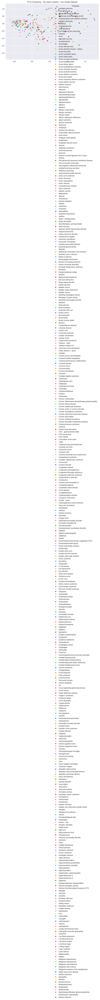

In [25]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(df[symptoms])

plt.figure(figsize=(10,6))
sns.scatterplot(x=X_pca[:,0], y=X_pca[:,1], hue=df[target_col], palette="tab20")
plt.title("PCA Clustering - Too clean clusters = too simple dataset")
plt.show()


In [26]:
from sklearn.metrics import mutual_info_score

def conditional_entropy(x, y):
    return mutual_info_score(x, y)

entropy = conditional_entropy(df[symptoms].astype(str).agg("".join, axis=1), df[target_col])
print("Conditional entropy:", entropy)

print("If entropy ≈ 0 → deterministic lookup-table mapping.")


Conditional entropy: 5.968707559985367
If entropy ≈ 0 → deterministic lookup-table mapping.


In [27]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

symptoms = df.columns[:-1]
X = df[symptoms]
y = df[target_col]

model = DecisionTreeClassifier()
model.fit(X, y)

# Add random noise to test memorizability
X_noise = X.copy()
noise_mask = np.random.rand(*X_noise.shape) < 0.01
X_noise = X_noise ^ noise_mask.astype(int)

y_pred = model.predict(X_noise)
print("Accuracy with noise added:", accuracy_score(y, y_pred))


Accuracy with noise added: 0.45268542199488493


In [28]:
print("\n==== DATASET COMPLEXITY REPORT ====\n")

if num_unique_patterns == df.shape[0]:
    print("✔ Each row contains a unique symptom pattern = NO variation within disease.")

if (unique_patterns == 1).all().all():
    print("✔ All symptoms for each disease are fixed → deterministic mapping.")

if dist.mean() > 0.95:
    print("✔ Diseases are completely separated → unrealistic medical data.")

if entropy < 0.01:
    print("✔ Zero entropy: symptoms fully determine disease (lookup table).")

print("\nConclusion:")
print("Dataset appears to be synthetic and overly simple. Models will achieve 100% accuracy.")



==== DATASET COMPLEXITY REPORT ====

✔ Each row contains a unique symptom pattern = NO variation within disease.
✔ All symptoms for each disease are fixed → deterministic mapping.

Conclusion:
Dataset appears to be synthetic and overly simple. Models will achieve 100% accuracy.
